In [1]:
import cv2
import numpy as np
from Computer_vision.Image_processing.cv_matrix import analyse_matrix, draw_resutls
from Computer_vision.Image_processing.cv_orientation import rotateImage, fing_petri_angle
import os
import glob
from Computer_vision.Image_processing.cv_matrix import analyse_matrix, draw_resutls
from Computer_vision.Image_processing.cv_orientation import rotateImage, fing_petri_angle
import matplotlib.pyplot as plt

In [156]:
def detect_blobs(input_image):
    image = input_image.copy()
    params = cv2.SimpleBlobDetector_Params()
 
    # Change thresholds
    params.minThreshold = 20
     
    # Filter by Area.
    params.filterByArea = True
    params.minArea = 200
    #params.maxArea = 6000
    
    # Filter by Circularity
    params.filterByCircularity = False
    params.minCircularity = 0.01
     
    # Filter by Convexity
    params.filterByConvexity = False
    params.minConvexity = 0.01
     
    # Filter by Inertia
    params.filterByInertia = False
    params.minInertiaRatio = 0.01
    
    colony_detector = cv2.SimpleBlobDetector_create(params)


    positions = [(285, 250), (850, 850)]
    num_cols: int = 9
    num_rows: int = 9
    
    matrix: np.ndarray = np.zeros((num_cols,num_rows))
    matrix_of_keypoints = [[0]*num_rows]*num_cols
    
    pos0: tuple = positions[0]
    pos1: tuple = positions[1]
    offset: tuple = ((pos1[0]-pos0[0])/num_cols, (pos1[1]-pos0[1])/num_rows)
    
    bw: np.ndarray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # old block value : 71
    # block value for 55
    tr: np.ndarray = cv2.adaptiveThreshold(bw,255,cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 95, -10)

    keypoints: list(cv2.KeyPoint) = colony_detector.detect(tr)

    N_blob = len(keypoints)
    thickness: int = 2
    new_offset = [0,0]

    X = np.zeros((2,len(keypoints)))

    # First use the position to fill the matrix
    for i, keypoint in enumerate(keypoints):
        cv2.circle(image, (int(keypoint.pt[0]), int(keypoint.pt[1])), int(keypoint.size), (0, 0, 255), 2)
        cv2.circle(image, (int(keypoint.pt[0]), int(keypoint.pt[1])), 2, (255, 0, 0), 2)
        X[0,i] = keypoint.pt[0]
        X[1,i] = keypoint.pt[1]
        
    return image, X

In [103]:

def auto_rotate_convolution(cropped_input,reference,angle_first_guess=0):
    #cropped_input = my_image
    bw: np.ndarray = cv2.cvtColor(cropped_input, cv2.COLOR_BGR2GRAY)
    tr= cv2.adaptiveThreshold(bw, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 71, -10)

    bw_ref: np.ndarray = cv2.cvtColor(reference, cv2.COLOR_BGR2GRAY)
    tr_ref= cv2.adaptiveThreshold(bw_ref, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 71, -10)
    #tr_ref=bw_ref
    #tr_ref.resize(tr.shape)
    min = 0
    for angle in np.arange(0,361,0.5):
        rotated_image = rotateImage(tr, -angle)
        convolution = np.multiply(255-rotated_image,255-tr_ref)
        norm = np.linalg.norm(convolution)
        #print('angle', angle, 'norm', norm)
        if norm>min:
            print('angle', angle, 'norm', norm)
            min_angle = angle
            min =norm
            
    return rotateImage(cropped_input, 90-min_angle)

In [95]:
def auto_rotate_number_of_blobs(cropped_input,reference,name="",angle_first_guess=0):

    bw_ref: np.ndarray = cv2.cvtColor(reference, cv2.COLOR_BGR2GRAY)
    tr_ref = cv2.adaptiveThreshold(bw_ref, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 71, -10)

    min = 0
    #for angle in np.arange(0, 362, 1):
    for angle in np.arange(angle_first_guess - 5, angle_first_guess + 5, 0.5):
        rotated_image = rotateImage(cropped_input, -angle)
        matrix, matrix_of_keypoints, new_offset, sum = analyse_matrix(rotated_image, [(285, 250), (850, 850)], draw_blob=False, auto_offset=False, num_cols=9)

        if sum >= min:
            print('angle', angle, 'norm', sum)
            min_angle = angle
            best_image = rotated_image
            best_image = draw_resutls(best_image, [(285, 250), (850, 850)],matrix, thickness= 2, num_cols = 9)
            min = sum



In [125]:
def detect_sticker(cropped_input) :
    bw: np.ndarray = cv2.cvtColor(cropped_input, cv2.COLOR_BGR2GRAY)
    tr = cv2.adaptiveThreshold(bw, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 255, -10)
    # Convert to grayscale.
    #gray = cv2.cvtColor(cropped_input, cv2.COLOR_BGR2GRAY)
    gray=tr

    # Blur using 3 * 3 kernel.
    gray_blurred = cv2.blur(gray, (3, 3))

    # Apply Hough transform on the blurred image.
    detected_circles = cv2.HoughCircles(gray_blurred,
                                        cv2.HOUGH_GRADIENT, 1, 20, param1=50,
                                        param2=28, minRadius=45, maxRadius=120)
    print(detected_circles)
    center = (535, 540)
    for pt in detected_circles[0, :]:
        a, b, r = pt[0], pt[1], pt[2]
        print("a",a,"b",b,"r",r)
        # Draw the circumference of the circle.
        if r<=57 and r>=49:
            cv2.circle(cropped_input, (int(a), int(b)), int(r), (0, 255, 0), 2)

        # Draw a small circle (of radius 1) to show the center.
            cv2.circle(cropped_input, (int(a), int(b)), 1, (0, 0, 255), 3)
            angle = np.arctan2((b-center[1]),(a-center[0]))*180/np.pi
 
    return cropped_input, tr, 180-angle


In [5]:

def detect_circles(cropped_input) :
    bw: np.ndarray = cv2.cvtColor(cropped_input, cv2.COLOR_BGR2GRAY)
    tr = cv2.adaptiveThreshold(bw, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 155, -10)
    # Convert to grayscale.
    gray=tr

    # Blur using 3 * 3 kernel.
    gray_blurred = cv2.blur(gray, (3, 3))

    # Apply Hough transform on the blurred image.
    detected_circles = cv2.HoughCircles(gray_blurred,
                                        cv2.HOUGH_GRADIENT, 1, 20, param1=50,
                                        param2=30, minRadius=5, maxRadius=50)

    try:
        for pt in detected_circles[0, :]:
            a, b, r = pt[0], pt[1], pt[2]
            print("a",a,"b",b,"r",r)
            # Draw the circumference of the circle.
            cv2.circle(cropped_input, (int(a), int(b)), int(r), (0, 255, 0), 2)

        # Draw a small circle (of radius 1) to show the center.
            cv2.circle(cropped_input, (int(a), int(b)), 1, (0, 0, 255), 3)
    except:
        pass
    return cropped_input

In [38]:
def detect_petri_dish_sides(cropped_input) :
    bw: np.ndarray = cv2.cvtColor(cropped_input, cv2.COLOR_BGR2GRAY)
    tr = cv2.adaptiveThreshold(bw, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 155, -10)
    # Convert to grayscale.
    gray=tr

    # Blur using 3 * 3 kernel.
    gray_blurred = cv2.blur(gray, (3, 3))

    # Apply Hough transform on the blurred image.
    detected_circles = cv2.HoughCircles(gray_blurred,
                                        cv2.HOUGH_GRADIENT, 1, 20, param1=50,
                                        param2=30, minRadius=432, maxRadius=440)

    try:
        for pt in detected_circles[0, :]:
            a, b, r = pt[0], pt[1], pt[2]
            print("a",a,"b",b,"r",r)
            # Draw the circumference of the circle.
            cv2.circle(cropped_input, (int(a), int(b)), int(r), (0, 255, 0), 2)

        # Draw a small circle (of radius 1) to show the center.
            cv2.circle(cropped_input, (int(a), int(b)), 1, (0, 0, 255), 3)
        return cropped_input
    except:
        pass
    return cropped_input
    

In [123]:
def filter_circle_petri(cropped_input,radius=450):
    # read image
    hh, ww = cropped_input.shape[:2]
    hh2 = hh // 2
    ww2 = ww // 2
    
    # define circles
    radius1 = 25
    radius2 = radius
    xc = hh // 2
    yc = ww // 2
    
    # draw filled circles in white on black background as masks
    mask1 = np.zeros_like(cropped_input)
    mask1 = cv2.circle(mask1, (xc,yc), radius1, (255,255,255), -1)
    mask2 = np.zeros_like(cropped_input)
    mask2 = cv2.circle(mask2, (xc,yc), radius2, (1,1,1), -1)
    
    # subtract masks and make into single channel
    mask = mask2
    
    # put mask into alpha channel of input
    #result = cv2.cvtColor(cropped_input, cv2.COLOR_BGR2BGRA)
    #result[:, :, 3] = mask[:,:,0]
    result = np.multiply(mask,cropped_input)
    
    return result

image name /Users/Etienne/Documents/GitHub/robot-interface/images/rotation_test_2/marker_0_20231113105012_name-1.jpg
angle 0.0 norm 237.6846650501458
angle 0.5 norm 14717.08564899994
angle 1.0 norm 14943.268752184042
angle 2.0 norm 15019.435941472635
angle 2.5 norm 15240.66734103202
angle 3.0 norm 15343.46929478467
angle 3.5 norm 15390.994347344813
angle 4.0 norm 15478.579844417252
angle 4.5 norm 15504.084526343373


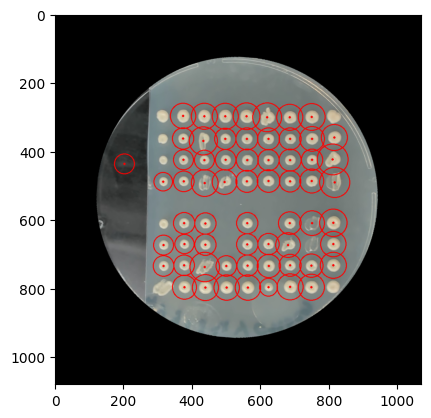

image name /Users/Etienne/Documents/GitHub/robot-interface/images/rotation_test_2/marker_1_20231108150152_name-2.jpg
angle 0.0 norm 230.05434140654683
angle 0.5 norm 14307.51617157919
angle 1.0 norm 14633.55110695965
angle 1.5 norm 14737.675223725077
angle 2.0 norm 14807.6978291698
angle 61.5 norm 14824.489974363367
angle 150.0 norm 14842.843831287857
angle 150.5 norm 14983.967965795977
angle 151.5 norm 15138.527636464518
angle 336.0 norm 15265.796670989694


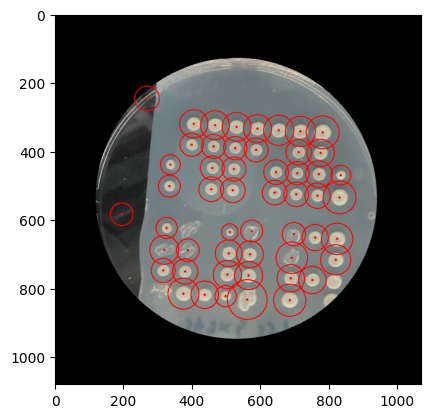

image name /Users/Etienne/Documents/GitHub/robot-interface/images/rotation_test_2/marker_1_20231113104715_a.jpg
angle 0.0 norm 246.31483917945343
angle 0.5 norm 13103.318701764068
angle 1.0 norm 13107.73641785644
angle 1.5 norm 13220.753874117769
angle 2.0 norm 13263.379622102355
angle 2.5 norm 13292.3566383091
angle 4.0 norm 13320.656440281013
angle 45.5 norm 13389.788123790458
angle 81.5 norm 13403.969710499945
angle 82.5 norm 13407.802429928628
angle 83.0 norm 13491.933145402107
angle 83.5 norm 13493.465789040265
angle 84.0 norm 13562.772688502893
angle 84.5 norm 13623.370361257892
angle 86.0 norm 13641.394760067607
angle 88.5 norm 13652.50405603309
angle 89.0 norm 13682.968939524784
angle 90.5 norm 13870.665557211016


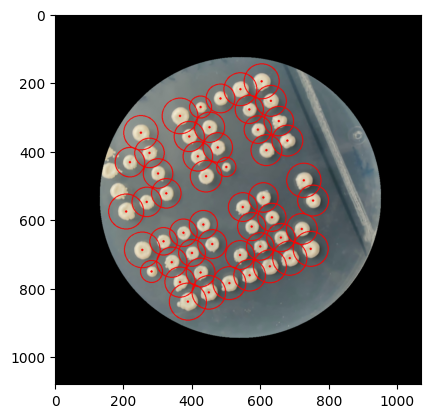

image name /Users/Etienne/Documents/GitHub/robot-interface/images/rotation_test_2/marker_1_20231127104232_original.jpg
angle 0.0 norm 221.67318286161725
angle 0.5 norm 13072.26093680814
angle 1.0 norm 13269.103021681609
angle 2.5 norm 13272.64084498635
angle 3.0 norm 13390.370009824224
angle 13.0 norm 13397.708722016612
angle 22.5 norm 13410.594580405448
angle 24.0 norm 13415.29947485333
angle 24.5 norm 13416.954535214018
angle 25.5 norm 13421.409463987007
angle 26.0 norm 13549.793208754147
angle 32.0 norm 13575.539620950616
angle 33.0 norm 13653.277884815792
angle 33.5 norm 13664.268403394306
angle 34.0 norm 13773.82372473236
angle 34.5 norm 13836.75099147195
angle 35.0 norm 13845.291799019622
angle 35.5 norm 13920.607062912162
angle 36.5 norm 13968.340524199715
angle 37.5 norm 13973.604760404525
angle 38.5 norm 14028.626875072272
angle 57.5 norm 14044.102498913913
angle 58.0 norm 14060.42513582004
angle 59.0 norm 14073.133695094351
angle 59.5 norm 14080.214238426914
angle 60.0 norm 1

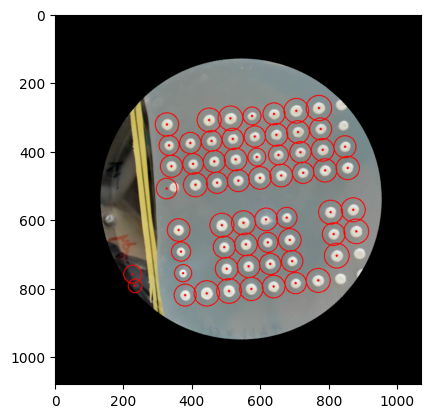

image name /Users/Etienne/Documents/GitHub/robot-interface/images/rotation_test_2/marker_1_20231127105534_original.jpg
angle 0.0 norm 216.05323418083793
angle 0.5 norm 14310.097798407947
angle 1.0 norm 14521.290576253889
angle 2.0 norm 14611.857855864873
angle 7.5 norm 14632.101318676003
angle 8.0 norm 14664.834059749875
angle 8.5 norm 14711.606302508235
angle 9.5 norm 14835.60308851649
angle 10.0 norm 14921.832159624368
angle 10.5 norm 14960.641764309445
angle 11.0 norm 15097.895383132047
angle 11.5 norm 15109.042160242985
angle 60.0 norm 15121.417460013463
angle 60.5 norm 15187.05168885653
angle 61.0 norm 15193.0167182163
angle 61.5 norm 15307.074900189127
angle 62.5 norm 15423.64973020329
angle 77.0 norm 15452.957225075077
angle 77.5 norm 15547.419271377485
angle 78.0 norm 15591.120261225618
angle 78.5 norm 15620.45117786295
angle 79.0 norm 15689.87087263627
angle 79.5 norm 15789.640401225102
angle 80.0 norm 15940.168976519666
angle 81.5 norm 15955.368187541146
angle 82.0 norm 15968

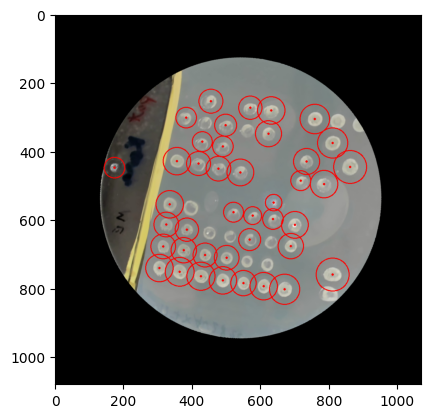

image name /Users/Etienne/Documents/GitHub/robot-interface/images/rotation_test_2/marker_1_20231127105844_original.jpg
angle 0.0 norm 237.25513693068902
angle 0.5 norm 14589.27767231812
angle 1.0 norm 14731.56817857488
angle 77.5 norm 14847.727805964116
angle 78.0 norm 14916.126541431593
angle 78.5 norm 14966.946682606977
angle 347.5 norm 14979.486339657979
angle 348.0 norm 15002.89132134203
angle 348.5 norm 15013.675998901801


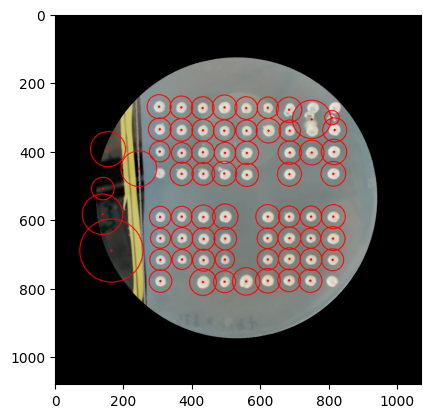

image name /Users/Etienne/Documents/GitHub/robot-interface/images/rotation_test_2/marker_1_20231127110055_original.jpg
angle 0.0 norm 233.84182688304503
angle 0.5 norm 13017.306403400053
angle 1.0 norm 13531.991760269439
angle 3.0 norm 13559.388518661157
angle 4.0 norm 13571.276248017355
angle 4.5 norm 13591.351551630176
angle 5.0 norm 13594.590468270826
angle 5.5 norm 13684.31003010382
angle 6.0 norm 13715.247828603025
angle 6.5 norm 13734.49372929341
angle 7.0 norm 13888.239881280853
angle 8.0 norm 13962.84193851667
angle 8.5 norm 14044.243589456857
angle 9.0 norm 14093.76706207393
angle 9.5 norm 14107.41787146039


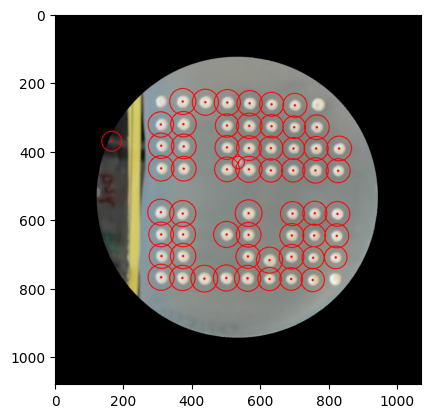

image name /Users/Etienne/Documents/GitHub/robot-interface/images/rotation_test_2/marker_1_20231127110230_original.jpg
angle 0.0 norm 226.9757696319147
angle 0.5 norm 14144.179191455403
angle 1.5 norm 14415.45115492401
angle 359.0 norm 14600.369447380433


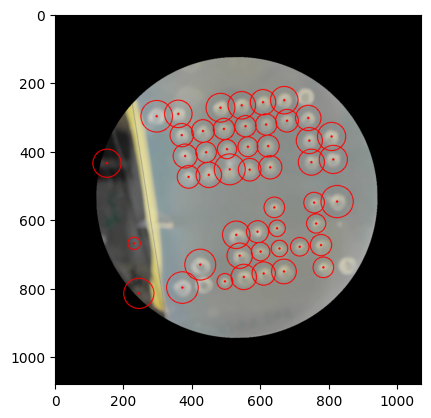

image name /Users/Etienne/Documents/GitHub/robot-interface/images/rotation_test_2/marker_2_20231108150226_name-3.jpg
angle 0.0 norm 225.67675999092154
angle 0.5 norm 11396.360340038393
angle 1.0 norm 11592.286659671594
angle 1.5 norm 11608.705827955157
angle 2.0 norm 11658.936014920058
angle 3.0 norm 11698.368604211444
angle 3.5 norm 11762.638947107065
angle 84.5 norm 11789.569627429153
angle 85.0 norm 11897.439178243358
angle 86.0 norm 11969.608723763697
angle 86.5 norm 12017.753367414394
angle 87.0 norm 12072.17900795047
angle 87.5 norm 12106.008342967552
angle 154.5 norm 12162.190222159823
angle 158.5 norm 12216.051039513546
angle 159.0 norm 12340.130874508584
angle 160.5 norm 12367.712642198638
angle 161.5 norm 12410.333718317166
angle 162.0 norm 12439.252429306192
angle 162.5 norm 12473.277436183322
angle 163.0 norm 12519.958785874656
angle 170.0 norm 12535.668191205445
angle 170.5 norm 12569.39191051023
angle 172.0 norm 12594.125575044898
angle 173.0 norm 12700.051220369152
angle

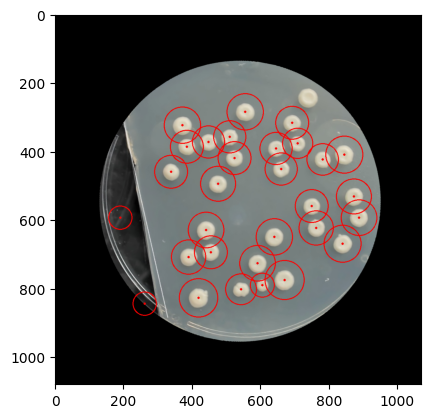

image name /Users/Etienne/Documents/GitHub/robot-interface/images/rotation_test_2/marker_2_20231113104506_b.jpg
angle 0.0 norm 221.10178651471816
angle 0.5 norm 12348.84545210604
angle 1.5 norm 12435.677906732708
angle 356.0 norm 12476.035788662999
angle 356.5 norm 12523.385684390623
angle 357.5 norm 12526.699325839987


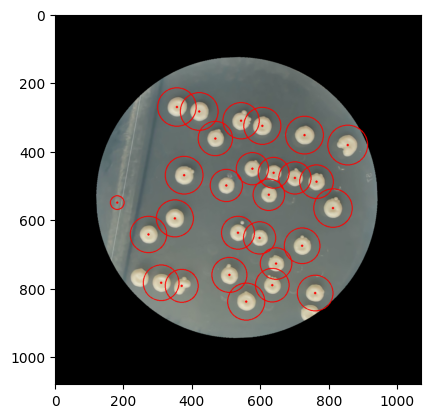

image name /Users/Etienne/Documents/GitHub/robot-interface/images/rotation_test_2/marker_2_20231127104157_kan.jpg
angle 0.0 norm 187.3606148580859
angle 0.5 norm 10941.823614005118
angle 1.5 norm 11134.174958208623
angle 2.0 norm 11178.25608044475
angle 2.5 norm 11186.340599141437
angle 3.0 norm 11213.523219755689
angle 9.5 norm 11217.063296603083
angle 11.5 norm 11226.815087102843
angle 12.0 norm 11235.626907298052
angle 12.5 norm 11295.574974298564
angle 13.5 norm 11411.813265208995
angle 14.5 norm 11495.885437842533
angle 15.0 norm 11568.8296728753
angle 16.5 norm 11637.762070088906
angle 89.0 norm 11746.57132954123


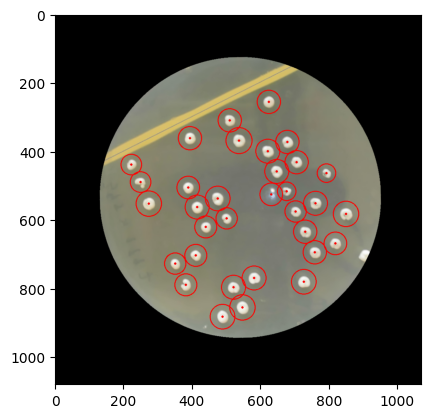

image name /Users/Etienne/Documents/GitHub/robot-interface/images/rotation_test_2/marker_2_20231127105057_ble.jpg
angle 0.0 norm 173.62603491412224
angle 0.5 norm 10330.996563739627
angle 1.0 norm 10571.838156158086
angle 1.5 norm 10596.063703092766
angle 2.0 norm 10775.946686950525
angle 3.5 norm 10825.154594739051
angle 4.0 norm 10851.871912255507
angle 5.5 norm 10942.925934136629
angle 6.0 norm 11031.5812103252
angle 6.5 norm 11087.91148052689
angle 7.0 norm 11153.350796957837
angle 7.5 norm 11175.539673769674
angle 8.0 norm 11272.426934782057
angle 8.5 norm 11360.857846131163
angle 9.0 norm 11370.50165999724
angle 9.5 norm 11439.069586290661
angle 10.0 norm 11505.79775591419
angle 88.0 norm 11522.476339745723
angle 88.5 norm 11669.177563136143
angle 89.5 norm 11834.883058146372


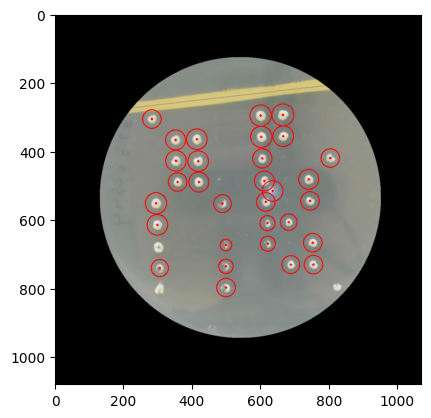

image name /Users/Etienne/Documents/GitHub/robot-interface/images/rotation_test_2/marker_2_20231127105459_nat.jpg
angle 0.0 norm 181.79933993279514
angle 0.5 norm 11597.890325399701
angle 1.0 norm 11885.10744587528
angle 2.0 norm 11980.699144874643
angle 2.5 norm 12001.703879033177
angle 3.0 norm 12156.429492248124
angle 5.0 norm 12166.344767431177
angle 5.5 norm 12177.660120072329
angle 84.5 norm 12187.021826516928
angle 85.0 norm 12197.263627551878
angle 86.0 norm 12207.227654139984
angle 175.0 norm 12271.196151964974
angle 175.5 norm 12340.890000320074


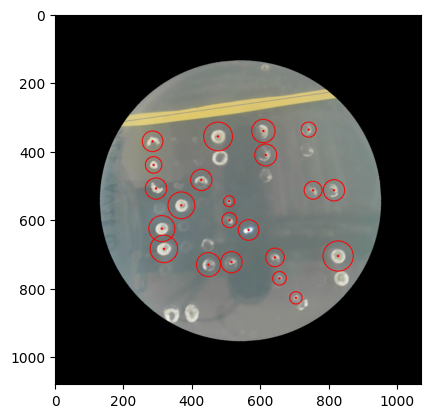

image name /Users/Etienne/Documents/GitHub/robot-interface/images/rotation_test_2/marker_2_20231127105811_kan.jpg
angle 0.0 norm 190.9031167896428
angle 0.5 norm 11116.095042774688
angle 1.0 norm 11385.692776462924
angle 2.0 norm 11527.630198787607
angle 2.5 norm 11540.830949286104
angle 3.5 norm 11597.773062101189
angle 74.5 norm 11628.806086610955
angle 75.0 norm 11737.584121104308
angle 75.5 norm 11785.0480270553
angle 76.0 norm 11808.433554032474
angle 76.5 norm 11815.471213624956
angle 77.0 norm 11883.79880341299
angle 77.5 norm 11985.988194554506


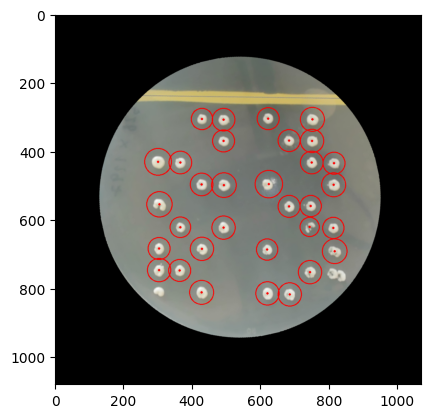

image name /Users/Etienne/Documents/GitHub/robot-interface/images/rotation_test_2/marker_2_20231127110022_ble.jpg
angle 0.0 norm 166.9281282468596
angle 0.5 norm 10736.245991965721
angle 1.5 norm 10939.626684672563
angle 12.5 norm 10972.196225004363
angle 13.0 norm 10987.49602957835
angle 13.5 norm 11129.140083582379
angle 14.0 norm 11281.370262516872
angle 14.5 norm 11395.97490344727
angle 15.0 norm 11449.997816593679
angle 15.5 norm 11541.151892250617
angle 16.0 norm 11567.923711712487
angle 16.5 norm 11601.410776280616
angle 17.0 norm 11606.763243902238
angle 18.0 norm 11614.349788085427
angle 108.5 norm 11663.824029879737


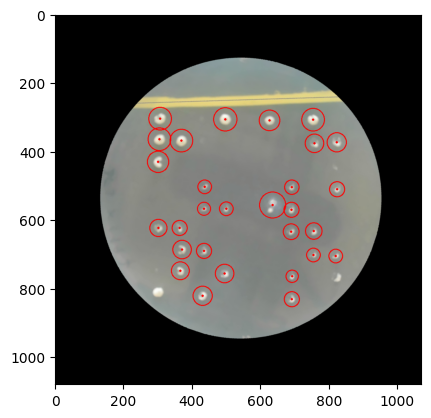

image name /Users/Etienne/Documents/GitHub/robot-interface/images/rotation_test_2/marker_2_20231127110158_kan.jpg
angle 0.0 norm 163.13797841091449
angle 0.5 norm 10196.790867719117
angle 1.0 norm 10395.057816097033
angle 1.5 norm 10459.754203613009
angle 2.0 norm 10527.840329336306
angle 73.5 norm 10541.599072247056
angle 74.0 norm 10630.404507825655
angle 342.5 norm 10675.330720872305
angle 344.0 norm 10731.176123799292
angle 345.0 norm 10756.416550134158
angle 346.0 norm 10765.477137591255
angle 346.5 norm 10830.83464004506
angle 347.5 norm 10843.992069344204
angle 348.0 norm 10903.319035963315


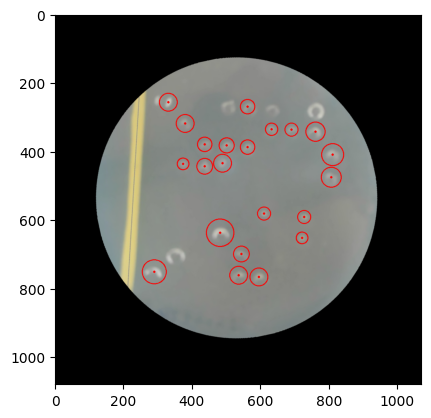

image name /Users/Etienne/Documents/GitHub/robot-interface/images/rotation_test_2/marker_3_20231113104433_c.jpg
angle 0.0 norm 263.51850029931484
angle 0.5 norm 14913.189263199203
angle 1.0 norm 15121.295678611672
angle 1.5 norm 15126.049385083998
angle 2.0 norm 15275.295512689763
angle 2.5 norm 15414.360090513002
angle 3.5 norm 15475.951667021967
angle 4.0 norm 15519.847357496787


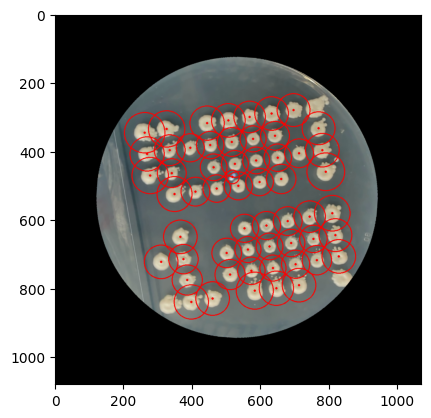

image name /Users/Etienne/Documents/GitHub/robot-interface/images/rotation_test_2/marker_3_20231127104500_hph.jpg
angle 0.0 norm 192.6577275896298
angle 0.5 norm 11128.948647558762
angle 1.0 norm 11373.420945344456
angle 1.5 norm 11502.466865850995
angle 2.0 norm 11583.338163068538
angle 3.0 norm 11641.239538812008
angle 14.0 norm 11703.52297387415
angle 14.5 norm 11726.6600104207
angle 15.0 norm 11821.039040625828
angle 89.0 norm 11825.053065420045
angle 90.5 norm 11877.088363736291
angle 91.0 norm 11921.708392675942


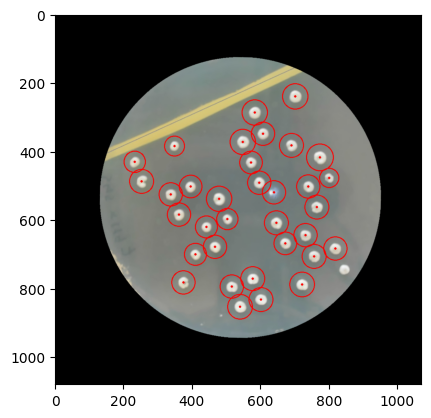

image name /Users/Etienne/Documents/GitHub/robot-interface/images/rotation_test_2/marker_3_20231127105022_bsd.jpg
angle 0.0 norm 211.3575170179665
angle 0.5 norm 13441.896964342495
angle 1.0 norm 13565.902955572106
angle 1.5 norm 13635.448434136664
angle 36.5 norm 13653.748020232393
angle 37.0 norm 13765.504967127068
angle 37.5 norm 13779.258760905828
angle 38.0 norm 13866.585448480098
angle 39.0 norm 13935.068281138776
angle 40.5 norm 14029.314559165034
angle 41.0 norm 14102.460707266659
angle 44.0 norm 14161.644042977496
angle 318.5 norm 14177.62501267402
angle 319.0 norm 14331.907305030967
angle 319.5 norm 14374.687544430313
angle 320.0 norm 14422.4317644425
angle 321.5 norm 14543.857053752969
angle 322.0 norm 14631.549986245476


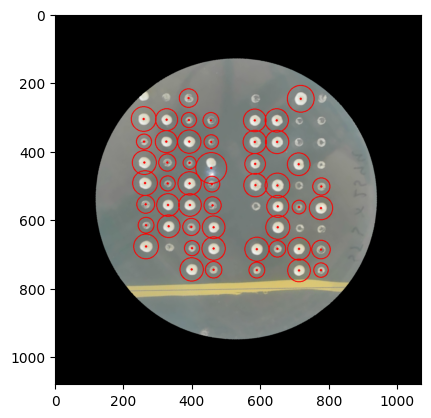

image name /Users/Etienne/Documents/GitHub/robot-interface/images/rotation_test_2/marker_3_20231127105424_pat.jpg
angle 0.0 norm 165.98795136997143
angle 0.5 norm 10719.688241735392
angle 1.0 norm 10746.39972269783
angle 2.0 norm 10822.79769745328
angle 18.0 norm 10852.217238887177
angle 19.0 norm 10889.355536486079
angle 19.5 norm 10907.341014197731
angle 20.0 norm 10954.302259842934
angle 20.5 norm 10970.72495325628
angle 29.5 norm 11033.298418877284
angle 31.0 norm 11068.2692865687
angle 31.5 norm 11275.724056573928
angle 32.0 norm 11456.900758931273
angle 33.0 norm 11686.596082692342
angle 33.5 norm 11790.84144580021
angle 34.5 norm 11836.748328827474
angle 36.0 norm 11914.025516172105
angle 90.5 norm 12022.288218138841
angle 106.0 norm 12051.396889987484
angle 106.5 norm 12107.645229358184
angle 107.0 norm 12186.336282903078
angle 107.5 norm 12189.735805176419
angle 108.0 norm 12300.89452031843
angle 109.5 norm 12320.886859313334
angle 110.0 norm 12347.142827391282
angle 110.5 nor

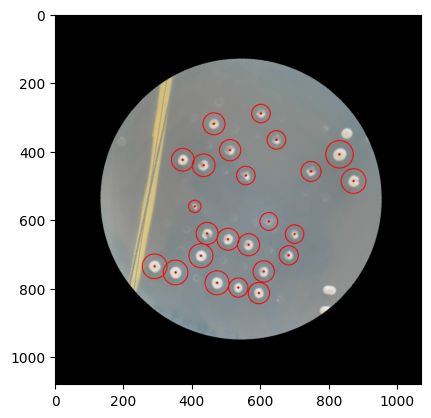

image name /Users/Etienne/Documents/GitHub/robot-interface/images/rotation_test_2/marker_3_20231127105737_nat.jpg
angle 0.0 norm 202.24984548819808
angle 0.5 norm 11720.15358261145
angle 1.0 norm 11787.60526994351
angle 1.5 norm 11820.127960390277
angle 2.0 norm 11851.494800235116
angle 67.5 norm 11902.51523838554
angle 68.0 norm 11953.273191891834
angle 68.5 norm 12140.578528225085
angle 69.0 norm 12248.565956878381
angle 69.5 norm 12252.367159043186
angle 70.0 norm 12356.984421775403
angle 71.0 norm 12424.000241468124


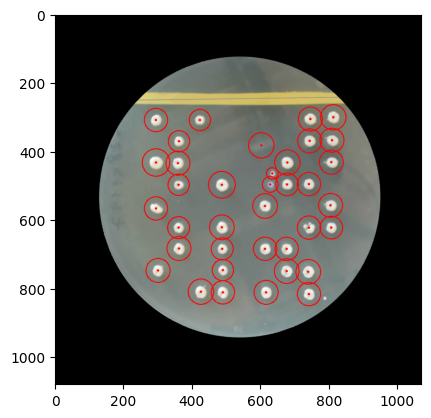

image name /Users/Etienne/Documents/GitHub/robot-interface/images/rotation_test_2/marker_3_20231127105949_bsd.jpg
angle 0.0 norm 214.5227260688247
angle 0.5 norm 13236.684970187966
angle 1.0 norm 13373.499055968861
angle 342.5 norm 13378.58038059345
angle 343.5 norm 13503.96978669606
angle 357.5 norm 13508.93711585038


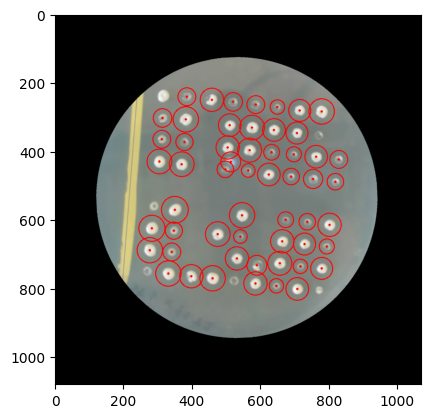

image name /Users/Etienne/Documents/GitHub/robot-interface/images/rotation_test_2/marker_3_20231127110126_pat.jpg
angle 0.0 norm 179.82491484774852
angle 0.5 norm 10194.01559739831
angle 1.0 norm 10336.147396394848
angle 1.5 norm 10410.02920264876
angle 2.0 norm 10526.59964090969
angle 3.0 norm 10564.57732235417
angle 78.5 norm 10580.583821321014
angle 85.0 norm 10589.455462864935
angle 85.5 norm 10614.00376860683
angle 86.0 norm 10635.431726074876
angle 86.5 norm 10732.800939177061
angle 87.0 norm 10744.870217922597
angle 87.5 norm 10790.887173907435
angle 88.5 norm 10835.390532878822
angle 90.5 norm 10926.507539008062
angle 97.5 norm 11004.983961823842
angle 98.5 norm 11092.982872068269
angle 99.0 norm 11281.367071414705
angle 99.5 norm 11354.35110431239
angle 100.0 norm 11444.855176016863
angle 100.5 norm 11475.054771111116
angle 101.0 norm 11623.428280847265
angle 101.5 norm 11756.469580618153
angle 102.0 norm 11959.912541486246
angle 102.5 norm 11963.566650460054
angle 269.0 norm 

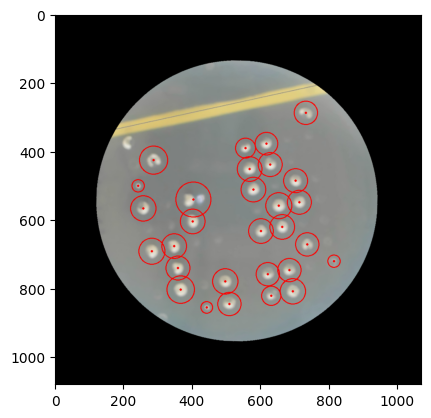

image name /Users/Etienne/Documents/GitHub/robot-interface/images/rotation_test_2/marker_4_20231127104947_kan.jpg
angle 0.0 norm 189.0
angle 0.5 norm 10910.640173701999
angle 1.0 norm 11053.40730272797
angle 1.5 norm 11084.420733624289
angle 78.5 norm 11089.14820894734
angle 79.0 norm 11119.52103285029
angle 80.0 norm 11164.755796702408
angle 80.5 norm 11198.228565268704
angle 81.0 norm 11281.029695909856
angle 81.5 norm 11357.47788903857
angle 82.0 norm 11411.82803060053
angle 82.5 norm 11488.196725335096
angle 83.0 norm 11563.951098132506
angle 83.5 norm 11604.608308771132
angle 84.0 norm 11698.606626432056
angle 84.5 norm 11772.925379870545
angle 85.5 norm 11780.956030815156
angle 86.0 norm 11789.934775052829
angle 86.5 norm 11830.387314031608
angle 89.0 norm 11994.263253739264


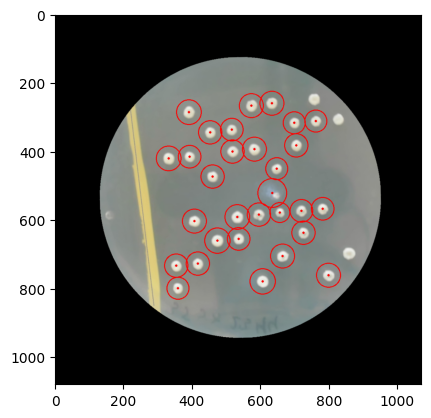

image name /Users/Etienne/Documents/GitHub/robot-interface/images/rotation_test_2/marker_4_20231127105917_kan.jpg
angle 0.0 norm 181.96153439669604
angle 0.5 norm 10733.211914427107
angle 1.0 norm 10889.14725770572
angle 1.5 norm 10901.820031536019
angle 2.0 norm 10944.202757624696
angle 3.0 norm 10990.906332054696
angle 3.5 norm 11026.4814877639
angle 4.0 norm 11048.064038554447
angle 23.0 norm 11077.884184265513
angle 26.0 norm 11169.149519994797
angle 28.5 norm 11227.324213720738
angle 29.0 norm 11254.609100275318
angle 29.5 norm 11273.702408703186
angle 30.0 norm 11391.163461209746
angle 30.5 norm 11403.731933012104
angle 31.5 norm 11514.813328925484
angle 32.0 norm 11621.09246155455
angle 32.5 norm 11732.201029644864
angle 33.5 norm 11828.394734705129
angle 34.0 norm 11843.750419525059
angle 34.5 norm 11862.177582552033
angle 35.0 norm 11940.255441153677
angle 35.5 norm 12049.67933183286


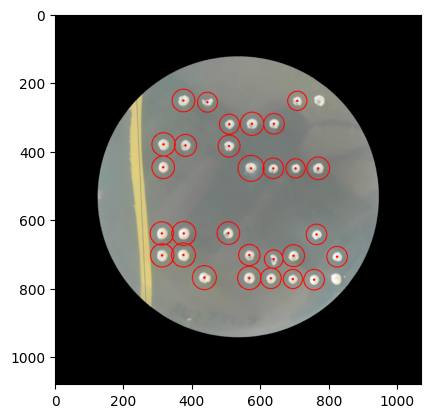

In [104]:
reference = cv2.imread("/Users/Etienne/Downloads/reference.png")
folder_name = "/Users/Etienne/Documents/GitHub/robot-interface/images/rotation_test_2"
experiment_name = folder_name.split("/")[-1]
path = os.path.join(folder_name, '*.jpg')

images = sorted(glob.glob(path))
#images = ['/Users/Etienne/Documents/GitHub/robot-interface/images/rotation_test/marker_0_20231113105012_name-1.jpg']
for image in images :
    print('image name',image)
    name = image.split("_")[-2]
    my_image = cv2.imread(image)
    cropped_input = my_image[:, 430:1500]
    
    #cropped_input,tr, angle  = detect_sticker(cropped_input)
    #print("ANGLE",angle)
    #rotated_image = rotateImage(cropped_input, -angle)
    #rotated_image = detect_petri_dish_sides(cropped_input)
    rotated_image = filter_circle_petri(cropped_input)
    rotated_image = cv2.cvtColor(rotated_image, cv2.COLOR_BGR2RGB)
    #plt.imshow(rotated_image)
    #plt.imshow(cv2.cvtColor(rotated_image, cv2.COLOR_BGR2RGB))
    #plt.show()
    rotated_image = auto_rotate_convolution(rotated_image,reference)
    
    rotated_image = detect_blobs(rotated_image)
    plt.imshow(rotated_image)
    #plt.imshow(cv2.cvtColor(rotated_image, cv2.COLOR_BGR2RGB))
    plt.show()

    #rotated_image = detect_circles(cropped_input)
    #auto_rotate_convolution(rotated_image, reference, name,angle_first_guess=0)
    #auto_rotate_number_of_blobs(rotated_image, reference, name, angle_first_guess=0)
    #rotated_image = rotateImage(cropped_input, -275)

    #matrix, matrix_of_keypoints, new_offset, sum = analyse_matrix(rotated_image, [(295, 250), (850, 850)],
    #                                                              draw_blob=False, auto_offset=False, num_cols=9)

    #rotated_image = draw_resutls(rotated_image, [(285, 250), (880, 840)], matrix, thickness=2, num_cols=9)


In [ ]:
import numpy as np
from sklearn.decomposition import PCA
X = np.array([[-1, -1], [-2, -1], [-3, -2], [1, 1], [2, 1], [3, 2]])
pca = PCA(n_components=2)
pca.fit(X)
print(pca.explained_variance_ratio_)
print(pca.singular_values_)

image name /Users/Etienne/Documents/GitHub/robot-interface/images/dec_5/marker_0_20231205104556_original.jpg
[[[779.5 823.5  55.2]]]
a 779.5 b 823.5 r 55.2


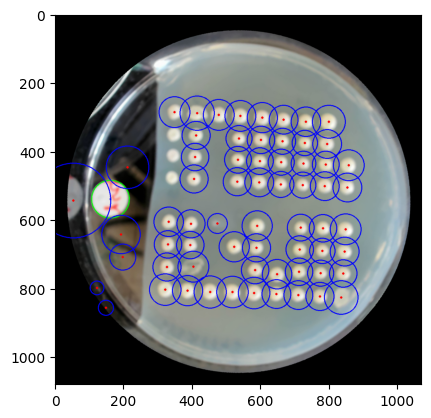

PCA RESULTS2 [-0.18579743  0.98258807] [-0.98258807 -0.18579743]
Angle 169.2923718634999


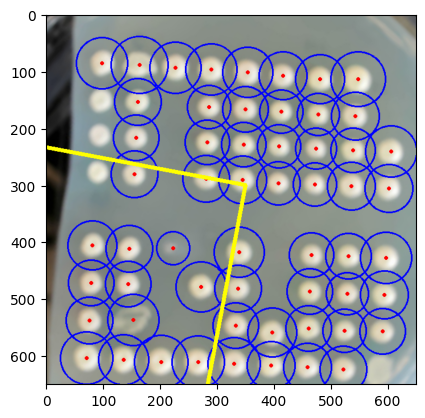

image name /Users/Etienne/Documents/GitHub/robot-interface/images/dec_5/marker_1_20231205104523_kan.jpg
[[[251.5 278.5  51.3]]]
a 251.5 b 278.5 r 51.3


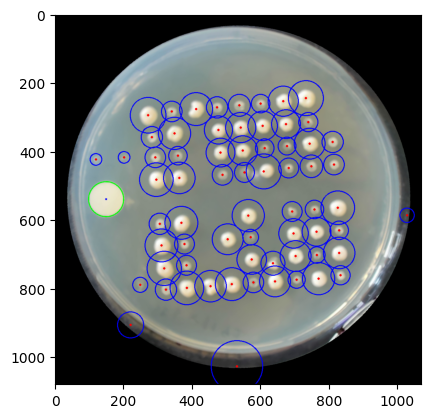

PCA RESULTS2 [ 0.16822507 -0.98574861] [-0.98574861 -0.16822507]
Angle 170.31536289922224


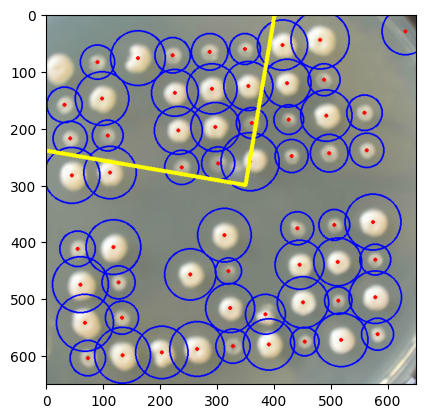

image name /Users/Etienne/Documents/GitHub/robot-interface/images/dec_5/marker_2_20231205104450_ble.jpg
[[[371.5 188.5  51.6]]]
a 371.5 b 188.5 r 51.6


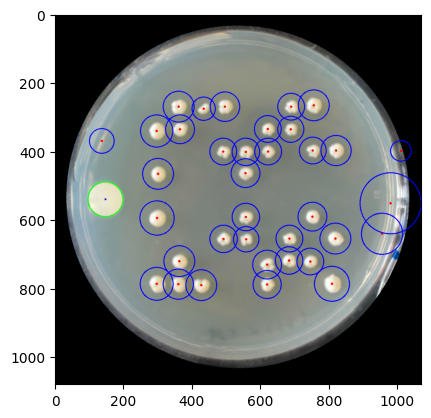

PCA RESULTS2 [0.06349679 0.99798204] [-0.99798204  0.06349679]
Angle 3.640546982164551


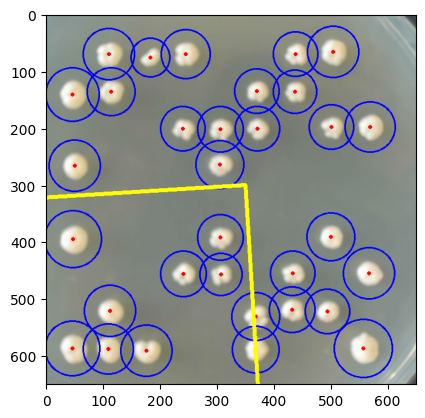

image name /Users/Etienne/Documents/GitHub/robot-interface/images/dec_5/marker_3_20231205104417_bsd.jpg
[[[153.5 603.5  49.5]]]
a 153.5 b 603.5 r 49.5


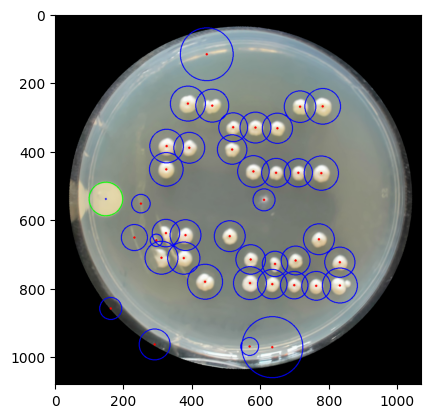

PCA RESULTS2 [-0.37246844 -0.92804486] [ 0.92804486 -0.37246844]
Angle 21.867933160180485


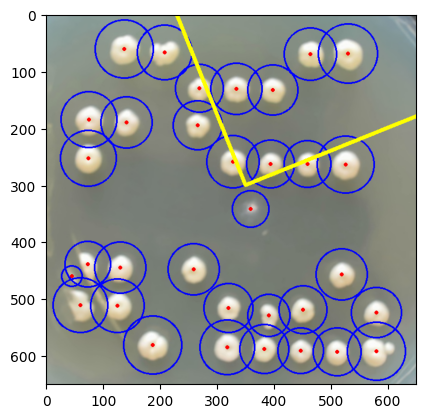

image name /Users/Etienne/Documents/GitHub/robot-interface/images/dec_5/marker_4_20231205104344_original.jpg
[[[903.5 621.5  52.3]
  [825.5 724.5 113.9]
  [774.5 801.5  84.1]
  [802.5 798.5  84.1]]]
a 903.5 b 621.5 r 52.3
a 825.5 b 724.5 r 113.9
a 774.5 b 801.5 r 84.1
a 802.5 b 798.5 r 84.1


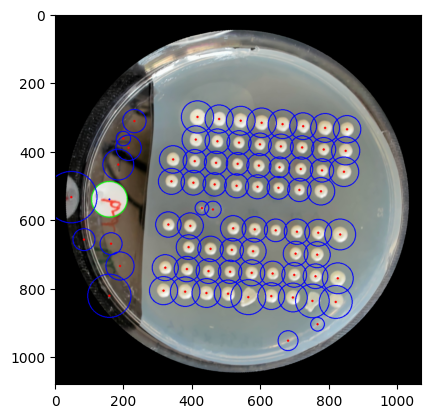

PCA RESULTS2 [ 0.56344111 -0.82615623] [0.82615623 0.56344111]
Angle 145.7058911717297


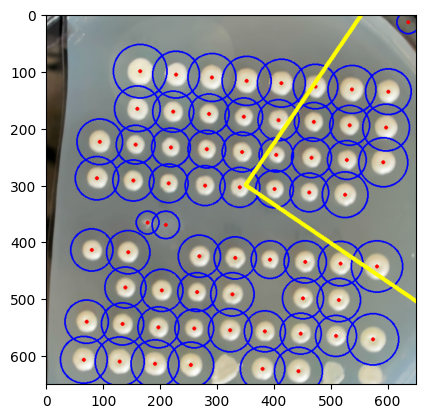

image name /Users/Etienne/Documents/GitHub/robot-interface/images/dec_5/marker_5_20231205104311_ble.jpg
[[[841.5 291.5  52.2]]]
a 841.5 b 291.5 r 52.2


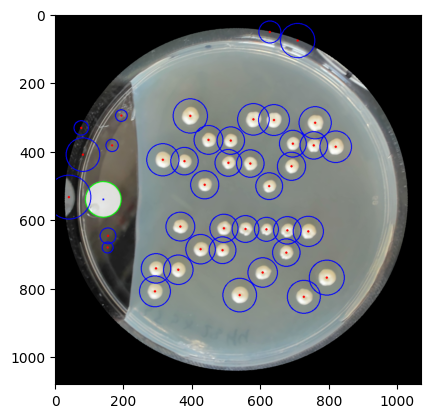

PCA RESULTS2 [-0.53699987  0.84358232] [0.84358232 0.53699987]
Angle 147.52036017957397


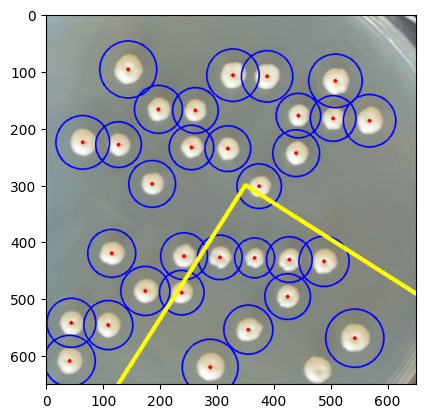

image name /Users/Etienne/Documents/GitHub/robot-interface/images/dec_5/marker_6_20231205104238_bsd.jpg
[[[567.5 132.5  51. ]]]
a 567.5 b 132.5 r 51.0


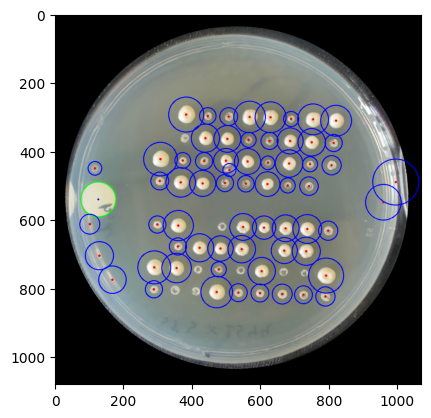

PCA RESULTS2 [-0.31200181  0.95008151] [0.95008151 0.31200181]
Angle 161.82008949776917


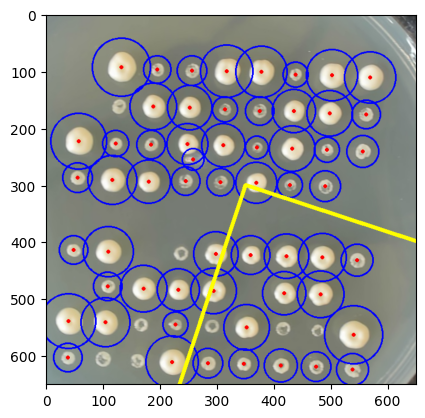

image name /Users/Etienne/Documents/GitHub/robot-interface/images/dec_5/marker_7_20231205104206_kan.jpg
[[[167.5 589.5  49.1]]]
a 167.5 b 589.5 r 49.1


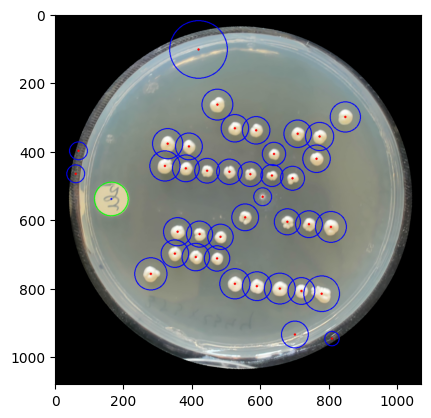

PCA RESULTS2 [ 0.37336078 -0.92768622] [0.92768622 0.37336078]
Angle 158.07696454321922


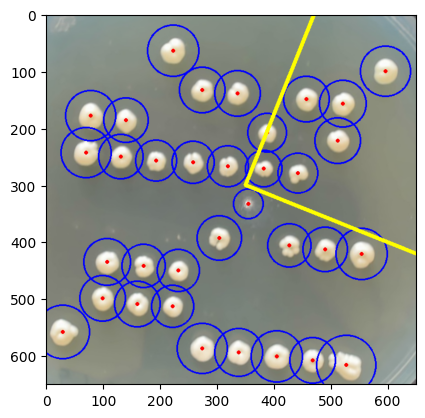

In [230]:
from sklearn.decomposition import PCA
##### reference = cv2.imread("/Users/Etienne/Downloads/reference.png")
folder_name = "/Users/Etienne/Documents/GitHub/robot-interface/images/dec_5"
experiment_name = folder_name.split("/")[-1]
path = os.path.join(folder_name, '*.jpg')

images = sorted(glob.glob(path))
#images = ['/Users/Etienne/Documents/GitHub/robot-interface/images/rotation_test/marker_0_20231113105012_name-1.jpg']
for image in images :
    print('image name',image)
    name = image.split("_")[-2]
    my_image = cv2.imread(image)
    cropped_input = my_image[:, 430:1500]
    
    #cropped_input,tr, angle  = detect_sticker(cropped_input)
    #print("ANGLE",angle)
    #rotated_image = rotateImage(cropped_input, -angle)
    #rotated_image = detect_petri_dish_sides(cropped_input)
    rotated_image = filter_circle_petri(cropped_input,500)
    rotated_image = cv2.cvtColor(rotated_image, cv2.COLOR_BGR2RGB)
    #plt.imshow(rotated_image)
    #plt.imshow(cv2.cvtColor(rotated_image, cv2.COLOR_BGR2RGB))
    #plt.show()
    angle = detect_sticker(rotated_image)[2]
    rotated_image = rotateImage(rotated_image, -angle)
    rotated_image_with_blobs, X = detect_blobs(rotated_image)

    plt.imshow(rotated_image_with_blobs)
    #plt.imshow(cv2.cvtColor(rotated_image, cv2.COLOR_BGR2RGB))
    plt.show()
    blob_cropped_zone = rotated_image[200:850,250:900,:]
    blob_cropped_zone,X = detect_blobs(blob_cropped_zone)
    pca = PCA(n_components=2,svd_solver="full")
    pca.fit(X.T)
    print('PCA RESULTS2',pca.components_[0],pca.components_[1])
    print("Angle",90-np.arctan(pca.components_[0][1]/pca.components_[0][0])*180/np.pi)
    cv2.arrowedLine(blob_cropped_zone, (350,300),(int(350+500*pca.components_[0][0]),int(300+500*pca.components_[0][1])),(255,255,0), 5)
    cv2.arrowedLine(blob_cropped_zone, (350,300),(int(350+500*pca.components_[1][0]),int(300+500*pca.components_[1][1])),(255,255,0), 5)

    #rotated_image = rotateImage(rotated_image, -angle)
    plt.imshow(blob_cropped_zone)  
    #plt.imshow(cv2.cvtColor(rotated_image, cv2.COLOR_BGR2RGB))
    plt.show()



In [290]:
def estimate_angle_via_graph_matrix(points):
    
    # Convert the list of points to a NumPy array
    points_array = np.array(points)
    
    # Calculate pairwise distances using cdist
    distance_matrix = cdist(points_array, points_array)
    
    #print("Distance Matrix:")
    #print(distance_matrix)
    np.set_printoptions(edgeitems=35)
    #print(np.multiply(distance_matrix>50,distance_matrix<70))
    new_image = blob_cropped_zone.copy()
    for i,point in enumerate(points):
        cv2.putText(new_image, str(i), (int(point[0]),int(point[1])),cv2.FONT_HERSHEY_SIMPLEX , 1,  
                     (0,255,0), 2, cv2.LINE_AA) 
    plt.imshow(new_image)
        #plt.imshow(cv2.cvtColor(rotated_image, cv2.COLOR_BGR2RGB))
    plt.show()
    list=[]
    for index,value in np.ndenumerate(np.multiply(distance_matrix>50,distance_matrix<70)):
        if value:
            #print("index",index)
            if points.T[0,index[1]]-points.T[0,index[0]]<0:
                angle = (np.arctan2((points.T[1,index[1]]-points.T[1,index[0]]),(points.T[0,index[1]]-points.T[0,index[0]]))*180/np.pi)%90  
                print("index",index,'angle',angle)
            #print('angle',angle)
                list.append(angle)
    mean_angle = np.mean(np.array(list))
    print('MEAN ANGLE',mean_angle)
    return mean_angle

image name /Users/Etienne/Documents/GitHub/robot-interface/images/dec_5/marker_0_20231205104556_original.jpg
[[[779.5 823.5  55.2]]]
a 779.5 b 823.5 r 55.2


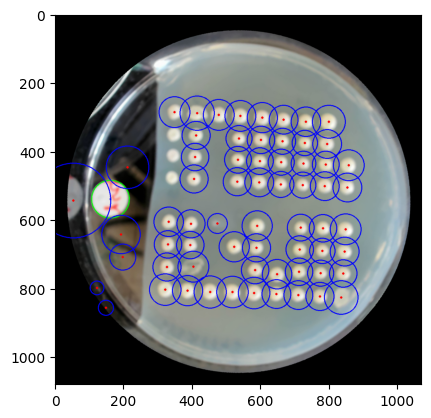

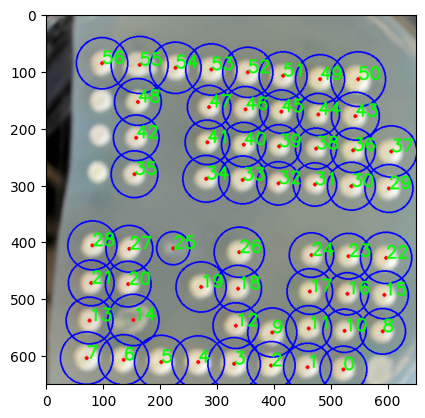

index (0, 1) angle 3.9659496050344956
index (1, 2) angle 2.189359610749193
index (2, 3) angle 2.736457700142097
index (3, 4) angle 2.6878757003438807
index (4, 5) angle 0.5422840328344307
index (5, 6) angle 2.703405414499457
index (6, 7) angle 3.2875855165183054
index (8, 10) angle 1.3510375650839137
index (9, 2) angle 1.8028806317099821
index (9, 12) angle 11.456116710583615
index (10, 0) angle 1.658763462971038
index (10, 11) angle 3.5730314649205184
index (11, 1) angle 1.9119198611187898
index (11, 9) angle 83.24995659068082
index (12, 3) angle 2.3935667051860605
index (13, 7) angle 4.053089933562205
index (14, 20) angle 82.31817942773519
index (15, 8) angle 3.321216678178274
index (15, 16) angle 2.592013186613684
index (16, 10) angle 4.689476705140265
index (16, 17) angle 2.654154030751471
index (17, 11) angle 1.9343325397974809
index (18, 12) angle 3.4599001641628035
index (18, 19) angle 2.9483318593243837
index (20, 21) angle 1.764666354224289
index (21, 13) angle 2.1887341305439

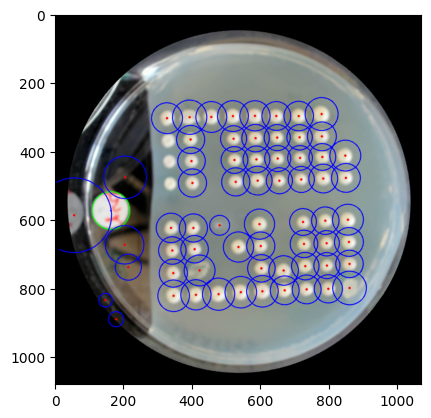

image name /Users/Etienne/Documents/GitHub/robot-interface/images/dec_5/marker_1_20231205104523_kan.jpg
[[[251.5 278.5  51.3]]]
a 251.5 b 278.5 r 51.3


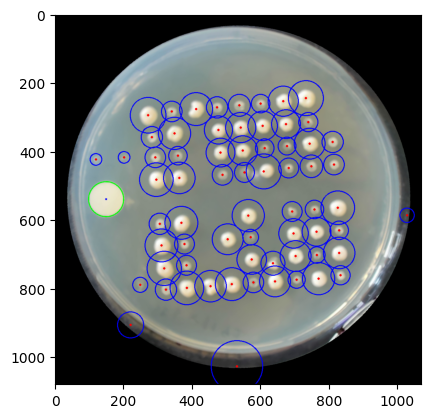

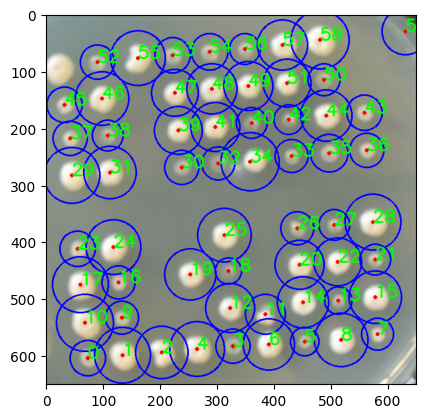

index (0, 10) angle 85.15526976146825
index (1, 0) angle 85.62200041841078
index (1, 9) angle 88.97406437919581
index (2, 1) angle 85.53500799591055
index (3, 4) angle 85.60446685495867
index (3, 12) angle 85.29048217002702
index (4, 2) angle 84.4193440192874
index (5, 6) angle 85.05755660879584
index (5, 14) angle 87.36407218661783
index (6, 3) angle 87.43685872865422
index (6, 11) angle 83.57572871416515
index (7, 8) angle 81.23206588553342
index (7, 15) angle 86.55024789729646
index (8, 5) angle 87.83138699010709
index (8, 13) angle 85.97126132539287
index (9, 10) angle 82.87669594498354
index (9, 16) angle 84.8389901063768
index (10, 17) angle 83.6058804285636
index (11, 12) angle 10.037560327542309
index (12, 18) angle 88.1268536789751
index (13, 14) angle 86.85359752019829
index (13, 22) angle 89.5050034399432
index (14, 11) angle 72.39467270716446
index (14, 20) angle 84.8094829328701
index (15, 13) angle 84.82170003266242
index (15, 21) angle 89.46490966871413
index (16, 17) an

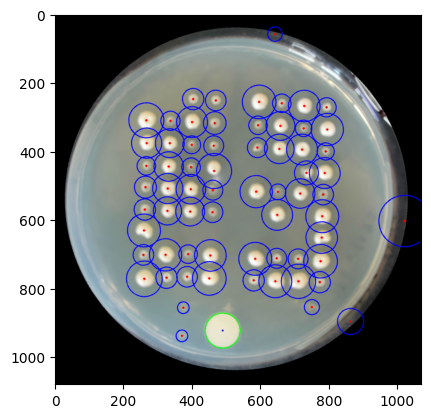

image name /Users/Etienne/Documents/GitHub/robot-interface/images/dec_5/marker_2_20231205104450_ble.jpg
[[[371.5 188.5  51.6]]]
a 371.5 b 188.5 r 51.6


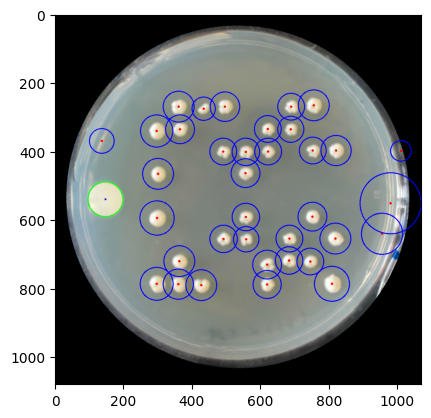

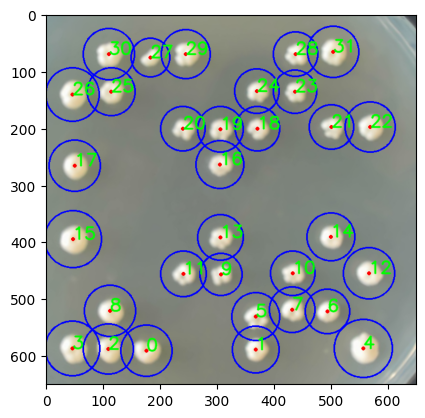

index (0, 2) angle 2.454800524971205
index (1, 5) angle 89.78786268061218
index (2, 3) angle 1.0044940144083228
index (6, 7) angle 2.1417725302665644
index (7, 5) angle 79.6249972180778
index (8, 2) angle 2.5563497792892065
index (9, 11) angle 1.3182184619314512
index (9, 13) angle 89.15217810347455
index (10, 7) angle 1.1605970586645356
index (18, 19) angle 89.30351252166096
index (18, 24) angle 88.76210825791144
index (19, 16) angle 0.7064438769719033
index (19, 20) angle 0.48057224288464795
index (22, 21) angle 89.5955493478107
index (23, 24) angle 1.0181166646662518
index (25, 26) angle 86.01684210054279
index (25, 30) angle 86.14556419787887
index (28, 23) angle 0.8049097179638096
index (29, 27) angle 84.54141259745012
index (31, 28) angle 86.4178652420517
MEAN ANGLE 44.14970835697445


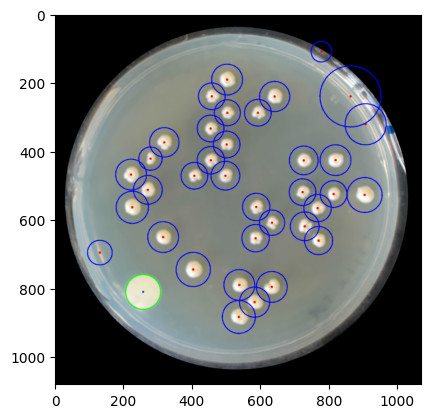

image name /Users/Etienne/Documents/GitHub/robot-interface/images/dec_5/marker_3_20231205104417_bsd.jpg
[[[153.5 603.5  49.5]]]
a 153.5 b 603.5 r 49.5


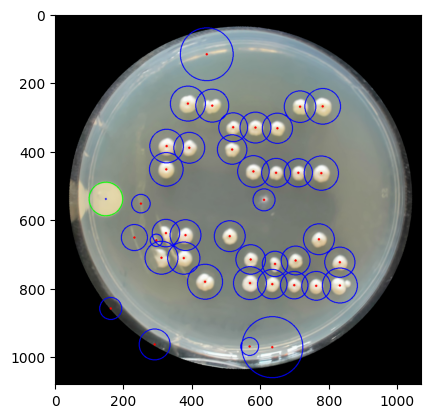

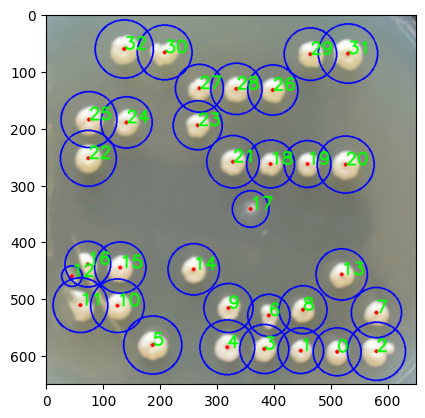

index (0, 1) angle 2.548739949876591
index (1, 3) angle 2.3620761001840265
index (2, 0) angle 88.49069507900805
index (2, 7) angle 89.91087698842307
index (3, 4) angle 2.2435824372840045
index (6, 3) angle 7.414613252966518
index (8, 6) angle 81.29074564839067
index (9, 4) angle 2.0222141256145534
index (10, 11) angle 0.881788073060136
index (11, 12) angle 73.87262071430779
index (15, 10) angle 4.076463354210361
index (15, 16) angle 6.664619622241332
index (18, 21) angle 3.1682932743705408
index (19, 18) angle 0.2804950480200148
index (20, 19) angle 0.966627302042383
index (24, 25) angle 4.022509915109794
index (25, 22) angle 1.5286311352626427
index (26, 28) angle 1.5159168069710347
index (27, 23) angle 2.8393458306509984
index (28, 27) angle 0.5203426611835482
index (31, 29) angle 89.57786682460414
MEAN ANGLE 22.199955435418197


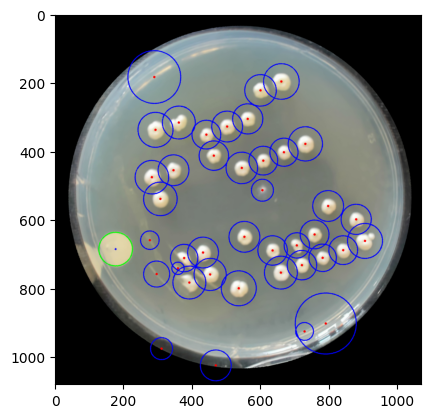

image name /Users/Etienne/Documents/GitHub/robot-interface/images/dec_5/marker_4_20231205104344_original.jpg
[[[903.5 621.5  52.3]
  [825.5 724.5 113.9]
  [774.5 801.5  84.1]
  [802.5 798.5  84.1]]]
a 903.5 b 621.5 r 52.3
a 825.5 b 724.5 r 113.9
a 774.5 b 801.5 r 84.1
a 802.5 b 798.5 r 84.1


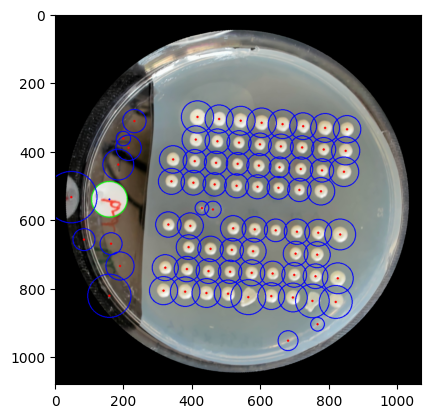

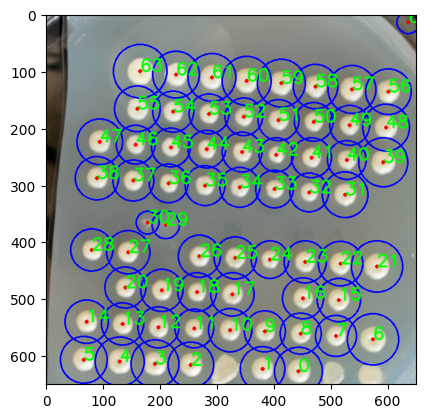

index (0, 1) angle 3.5463577053421886
index (2, 3) angle 1.607467999787815
index (3, 4) angle 3.9244235649250356
index (4, 5) angle 3.2497098279194176
index (6, 7) angle 5.2096435037834965
index (7, 8) angle 4.057646504131355
index (8, 0) angle 3.157630743366809
index (8, 9) angle 3.119424568054086
index (9, 1) angle 3.838000509606843
index (9, 10) angle 2.2471199100479
index (10, 11) angle 2.802080213369379
index (11, 2) angle 4.766645277048227
index (11, 12) angle 1.3865028047182761
index (12, 3) angle 5.430160671379895
index (12, 13) angle 5.2828417907884955
index (13, 4) angle 4.452722597137509
index (13, 14) angle 3.93244216023632
index (14, 5) angle 4.698028154909821
index (15, 7) angle 4.218319850914924
index (15, 16) angle 2.8316561459647005
index (16, 8) angle 3.5783017484265542
index (17, 10) angle 4.179156023350259
index (17, 18) angle 3.0685533005219554
index (18, 11) angle 4.5680364562153954
index (18, 19) angle 3.2362278311973967
index (19, 12) angle 4.951730509858223
ind

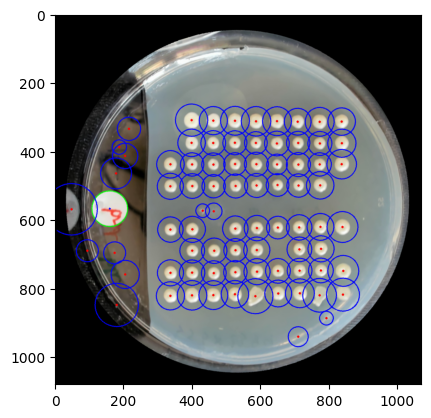

image name /Users/Etienne/Documents/GitHub/robot-interface/images/dec_5/marker_5_20231205104311_ble.jpg
[[[841.5 291.5  52.2]]]
a 841.5 b 291.5 r 52.2


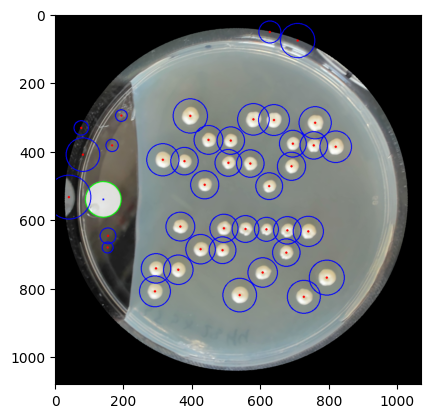

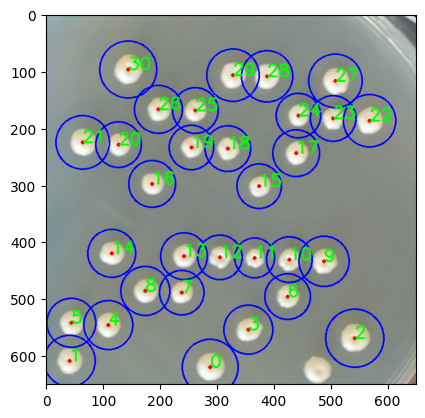

index (4, 5) angle 3.1138933958535233
index (5, 1) angle 2.89327465753378
index (7, 8) angle 2.8025311045038563
index (9, 10) angle 2.4844722987109265
index (10, 6) angle 2.7213963822780727
index (10, 11) angle 2.815514943953275
index (11, 12) angle 1.6333325515489605
index (12, 13) angle 1.846763123195558
index (13, 7) angle 3.517238333504693
index (18, 19) angle 2.5078173077820907
index (20, 21) angle 3.9300226403055945
index (22, 23) angle 3.658482976636577
index (23, 24) angle 5.217731272244436
index (24, 17) angle 2.689274103169012
index (25, 19) angle 5.4635243527397535
index (25, 26) angle 1.3470897193403744
index (27, 23) angle 4.121469905335275
index (28, 29) angle 1.9021315094719
MEAN ANGLE 3.03699780989487


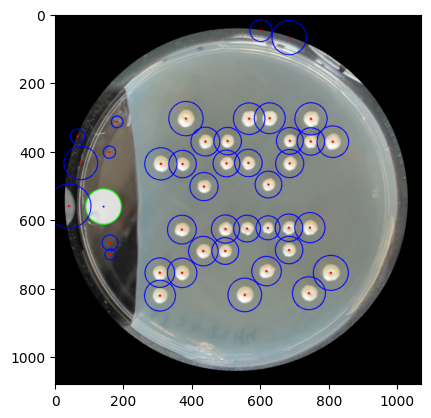

image name /Users/Etienne/Documents/GitHub/robot-interface/images/dec_5/marker_6_20231205104238_bsd.jpg
[[[567.5 132.5  51. ]]]
a 567.5 b 132.5 r 51.0


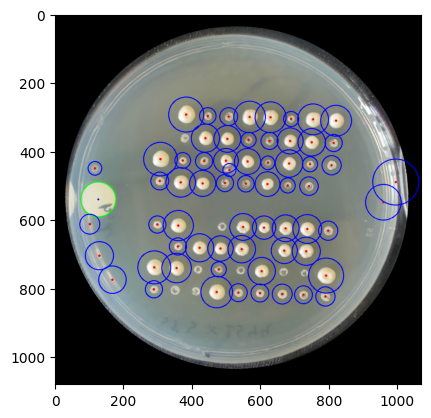

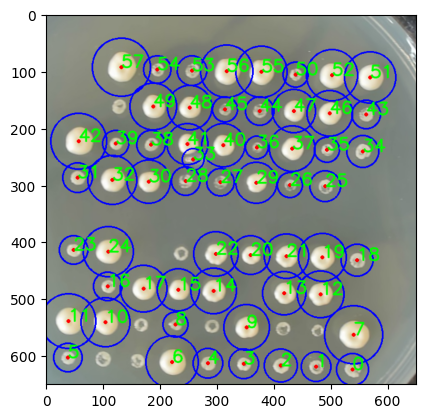

index (0, 1) angle 4.5899620698174886
index (1, 2) angle 2.1068336867099617
index (2, 3) angle 2.416914504236331
index (3, 4) angle 1.2069249342096384
index (4, 6) angle 2.0482469689924585
index (7, 0) angle 2.4451798350528975
index (8, 6) angle 4.846218841303752
index (9, 3) angle 4.273590677601234
index (10, 11) angle 2.368151918761896
index (11, 5) angle 1.212085182783838
index (12, 13) angle 1.5100980425417276
index (14, 15) angle 1.8079690968164073
index (15, 8) angle 4.961848187491427
index (15, 17) angle 2.01317953418382
index (16, 10) angle 3.894054490817652
index (17, 16) angle 3.58120110333806
index (18, 19) angle 4.721357890025075
index (19, 12) angle 2.75706018027104
index (19, 21) angle 1.8894123773754359
index (20, 22) angle 1.5754383037187267
index (21, 13) angle 3.0343186918259306
index (21, 20) angle 2.121683790338693
index (22, 14) angle 3.314642009634227
index (24, 16) angle 0.45215230798740436
index (24, 23) angle 2.3607953807250794
index (25, 26) angle 2.4690075029

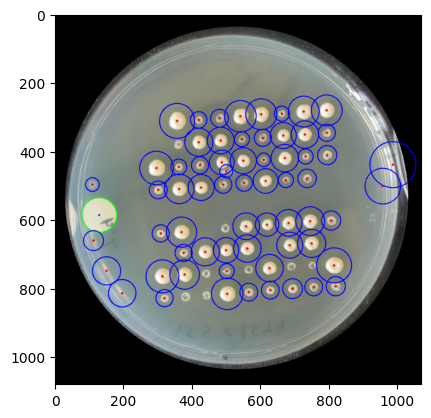

image name /Users/Etienne/Documents/GitHub/robot-interface/images/dec_5/marker_7_20231205104206_kan.jpg
[[[167.5 589.5  49.1]]]
a 167.5 b 589.5 r 49.1


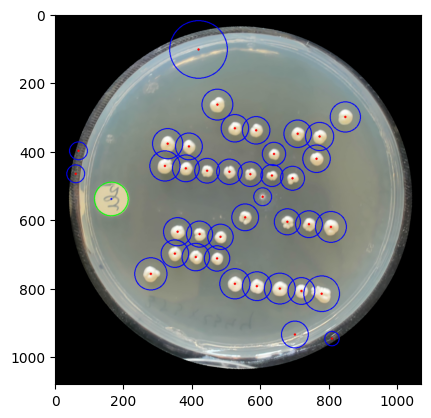

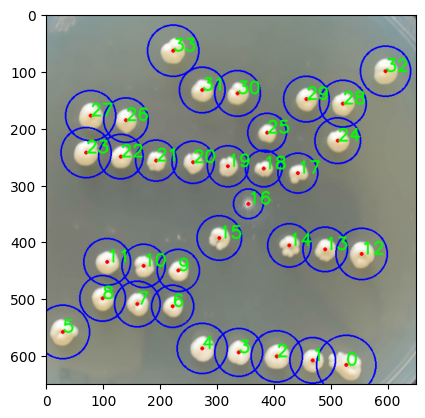

index (0, 1) angle 7.756057485737756
index (1, 2) angle 6.097263345240947
index (2, 3) angle 6.124236041497767
index (3, 4) angle 6.02686094978705
index (6, 7) angle 3.9387472316706464
index (7, 8) angle 8.864787584510509
index (9, 6) angle 9.02310926408498
index (9, 10) angle 7.627831789308544
index (10, 7) angle 9.29306824386731
index (10, 11) angle 6.002460790261864
index (11, 8) angle 7.338616536398362
index (12, 13) angle 7.013191171891464
index (13, 14) angle 6.450624237844636
index (17, 18) angle 7.787466947767712
index (18, 16) angle 22.876986593971267
index (18, 19) angle 3.652482894091378
index (19, 20) angle 6.044686386055531
index (20, 21) angle 2.5136495161604273
index (21, 22) angle 6.399981789295111
index (22, 23) angle 6.704964442941986
index (25, 18) angle 5.658140279321046
index (26, 22) angle 7.709369230280146
index (26, 27) angle 7.440056621374367
index (27, 23) angle 7.128222661141223
index (28, 24) angle 7.917861857898629
index (28, 29) angle 7.058319455776655
ind

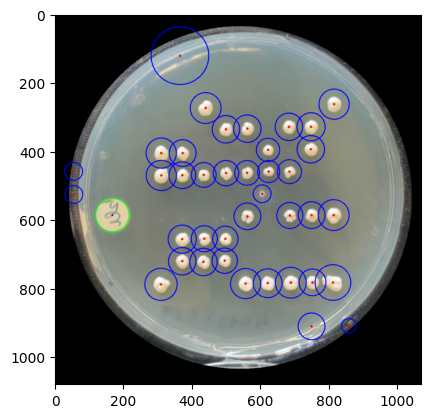

In [291]:
folder_name = "/Users/Etienne/Documents/GitHub/robot-interface/images/dec_5"
experiment_name = folder_name.split("/")[-1]
path = os.path.join(folder_name, '*.jpg')

images = sorted(glob.glob(path))
for image in images :
    print('image name',image)
    name = image.split("_")[-2]
    my_image = cv2.imread(image)
    cropped_input = my_image[:, 430:1500]
    
    rotated_image = filter_circle_petri(cropped_input,500)
    rotated_image = cv2.cvtColor(rotated_image, cv2.COLOR_BGR2RGB)

    angle = detect_sticker(rotated_image)[2]
    rotated_image = rotateImage(rotated_image, -angle)
    
    rotated_image_with_blobs, X = detect_blobs(rotated_image)

    plt.imshow(rotated_image_with_blobs)
    plt.show()
    blob_cropped_zone = rotated_image[200:850,250:900,:]
    blob_cropped_zone, X = detect_blobs(blob_cropped_zone)

    estimated_correction = estimate_angle_via_graph_matrix(X.T)
    
    corrected_image = rotateImage(rotated_image_with_blobs, estimated_correction)
    
    plt.imshow(corrected_image)
    plt.show()

